In [1]:
import numpy as np 
import gudhi
from sklearn import preprocessing
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist, pdist, squareform
from utils import *
sys.path.insert(0, './../')
from DensiTDA import landmarktools
from DensiTDA import alphatools 
from DensiTDA import graphtools 
from scipy.sparse.csgraph import minimum_spanning_tree

def merge(list1, list2):

    merged_list = [(list1[i], list2[i]) for i in range(0, len(list1))]
    
    return merged_list

# Extract Data

In [2]:
folder = 'Toroidal_topology_grid_cell_data//' # directory to data

In [3]:
## Iterates over the different datasets
for rat_name, mod_name, sess_name, day_name in [ ('R', '2', 'OF', 'day1') ]:
    
    if sess_name in ('OF', 'WW'):
        sspikes, xx, yy, aa, tt = get_spikes(rat_name, mod_name, day_name, sess_name, bType = 'pure',
                                         bSmooth = True, bSpeed = True, folder = folder )
    else:
        sspikes = get_spikes(rat_name, mod_name, day_name, sess_name, bType = 'pure', bSmooth = False, bSpeed = False, folder = folder)


In [4]:
top_active_times = 10000

# Extract Actively Moving Times

In [5]:
x_min = min(xx)
x_max = max(xx)

y_min = min(yy)
y_max = max(yy)

N_T, N_N = sspikes.shape

In [6]:
# generate D^k
D_k = []

for k in range(N_N):
    indices = sspikes[:,k] >= 0.99
    curr_D_k = merge(xx[indices], yy[indices])    
    D_k.append(curr_D_k)

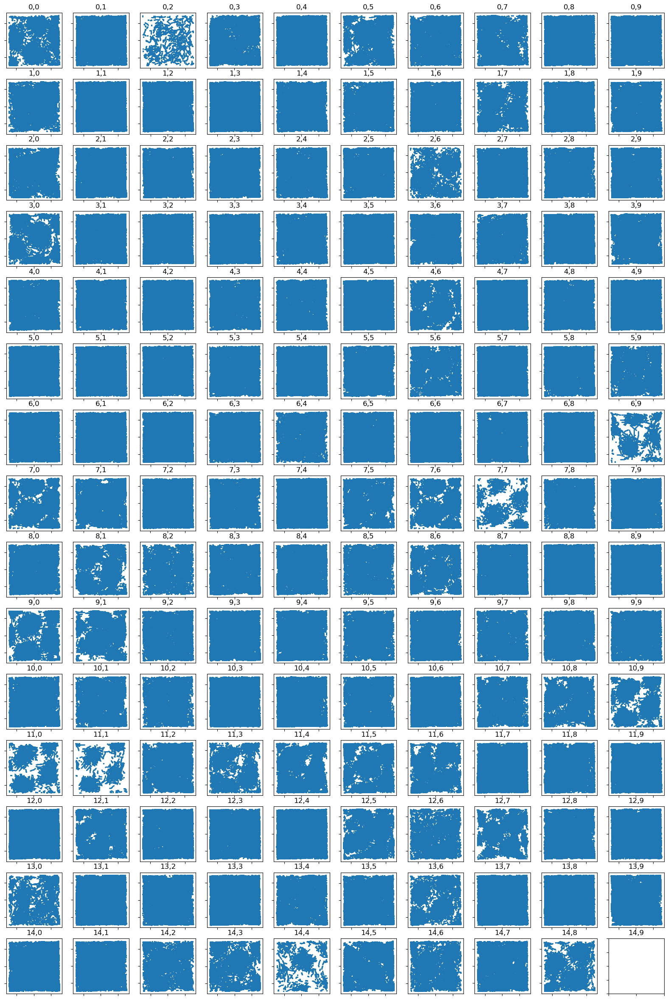

In [7]:
columns = 10
rows = 15
k = 0
fig, ax_array = plt.subplots(rows, columns, squeeze=False, figsize=(20,30))
for i,ax_row in enumerate(ax_array):
    for j,axes in enumerate(ax_row):
        axes.set_title('{},{}'.format(i,j))
        axes.set_yticklabels([])
        axes.set_xticklabels([])
        if k < N_N:
            plot_array = np.array(D_k[k])
            axes.scatter(plot_array[:,0], plot_array[:,1], s=1, alpha=1)
            k += 1
        else:
            break

plt.show()

In [8]:
delta_x = xx[1:] - xx[:-1]
delta_y = yy[1:] - yy[:-1]
delta_t = tt[1:] - tt[:-1]

In [9]:
speed = []

for del_x, del_y, del_t in zip(delta_x, delta_y, delta_t):
    speed.append(np.sqrt(del_x ** 2 + del_y ** 2) / del_t)

speed.append(0)

In [10]:
min_speed_consideration = sorted(speed)[-top_active_times]

In [11]:


#min_speed_consideration = np.mean(speed) + 1 * np.std(speed)

In [12]:
active_times = speed > min_speed_consideration

In [13]:
X = sspikes[active_times]

In [14]:
speedy_xx = xx[active_times]

In [15]:
speedy_yy = yy[active_times]

In [16]:
N_T, N_N = X.shape

In [17]:
# generate D^k
D_k = []

for k in range(N_N):
    indices = X[:,k] >= 0.99
    curr_D_k = merge(speedy_xx[indices], speedy_yy[indices])    
    D_k.append(curr_D_k)

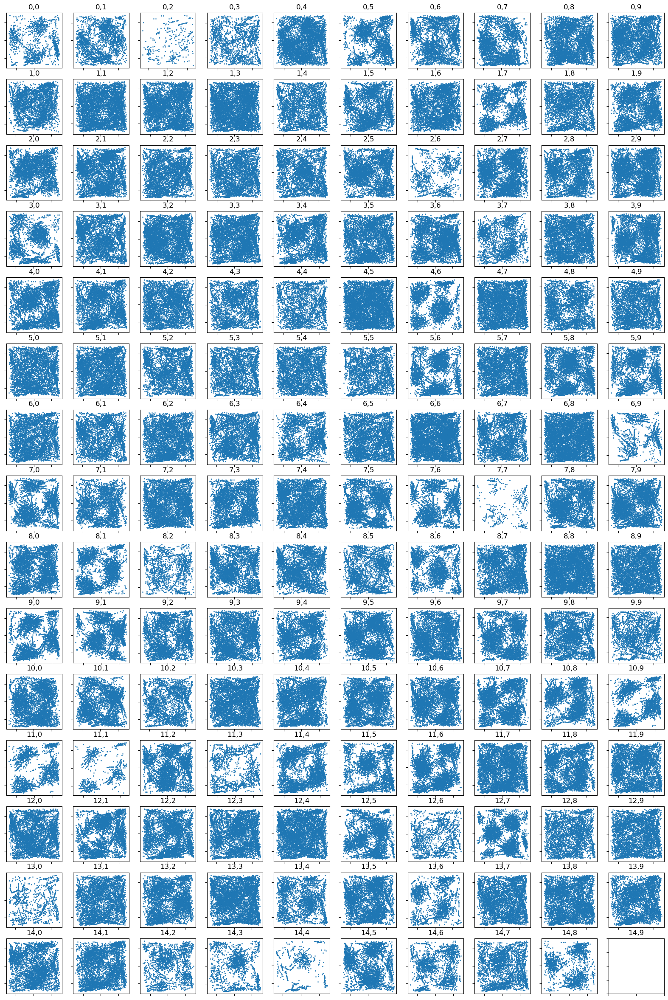

In [18]:
columns = 10
rows = 15
k = 0
fig, ax_array = plt.subplots(rows, columns, squeeze=False, figsize=(20,30))
for i,ax_row in enumerate(ax_array):
    for j,axes in enumerate(ax_row):
        axes.set_title('{},{}'.format(i,j))
        axes.set_yticklabels([])
        axes.set_xticklabels([])
        if k < N_N:
            plot_array = np.array(D_k[k])
            axes.scatter(plot_array[:,0], plot_array[:,1], s=1, alpha=1)
            k += 1
        else:
            break

plt.show()

# Project Down into $\mathbb R^6$

In [19]:
pca = PCA(n_components=6, svd_solver='full')
Y = pca.fit_transform(preprocessing.scale(X))

In [20]:
Y.shape

(9999, 6)

In [21]:
Y = np.divide(Y.T, np.linalg.norm(Y, axis=1)).T

# Landmark on $\mathbb S^5$

In [22]:
# hyperparameters
# code these as defaults versus user instantiated 
d = Y.shape[1]
h = np.std(Y) * (len(Y)) ** (-1 / (d + 4))
t = 1 / h ** 2
A = np.ones(len(Y)) / (h * len(Y))
s = 0.5

In [23]:
chosen_landmarks, chosen_powers = landmarktools.optimal_spherical_landmarking(Y, A, t, s, 90) #todo change to percentile

Calculating Projections p(x)


100%|████████████████████████████████████████████| 1/1 [00:00<00:00, 270.29it/s]

Calculating tilde f(y)



100%|████████████████████████████████████████████| 1/1 [00:00<00:00, 243.49it/s]


Greedy algorithm


100%|█████████████████████████████████████| 9999/9999 [00:02<00:00, 4430.71it/s]


In [24]:
print("Precentage of points selected: ", 100 * len(chosen_landmarks) / len(Y))

Precentage of points selected:  10.441044104410441


In [25]:
#k_fun(x_at_90th_percentile) = 0.066

In [26]:
#alpha_val = 5.0 = -np.log(prev_val)

In [27]:
len(chosen_landmarks)

1044

# Identify Average Distance

In [28]:
distance_distribution = squareform(pdist(chosen_landmarks))

In [29]:
distances = minimum_spanning_tree(distance_distribution)

In [30]:
alpha = np.max(np.max(distances, axis=1))

In [31]:
#alpha

In [32]:
#s ** (1/t)

In [33]:
#alpha = 0.
alpha = np.sqrt(2 - 2 * s ** (1/t))
#alpha = s #choose the cutoff value that is the 90th percentile

In [34]:
alpha

0.1904689201979658

In [35]:
#alpha = 0.45

# Construct Alpha Complex on Landmarked Points

In [36]:
S = np.array(chosen_landmarks)

In [37]:
P = np.zeros(len(chosen_landmarks))
D = 3

In [38]:
my_alpha_complex = alphatools.compute_alpha_complex(S, P, alpha, D)

Generating 1-Dimensional Weighted Cech Complex


100%|█████████████████████████████████████████████| 2/2 [00:02<00:00,  1.39s/it]

	Total Edges of Cech Graph:  62527
	Highest Degree of Cech Graph:  171
	Average Degree of Cech Graph:  119.78352490421456
	Number of Connected Components:  1
Begin Computing Alpha Complex
Preprocessing Dual Matrices:  1044



100%|█████████████████████████████████████████████| 2/2 [00:01<00:00,  1.31it/s]


*********** BEGIN DIMENSION 0 ***********
	Possible Facets:  1044


100%|████████████████████████████████████| 1044/1044 [00:00<00:00, 18736.83it/s]


	Final Number of Facets:  1044
*********** BEGIN DIMENSION 1 ***********
	Possible Facets:  62527


100%|██████████████████████████████████| 62527/62527 [00:04<00:00, 13985.96it/s]


	Final Number of Facets:  14333
*********** BEGIN DIMENSION 2 ***********
Estimating Number of Facets for dimension  2
	Possible Facets:  62176


100%|██████████████████████████████████| 62176/62176 [00:04<00:00, 13740.38it/s]


	Final Number of Facets:  50458
*********** BEGIN DIMENSION 3 ***********
Estimating Number of Facets for dimension  3
	Possible Facets:  661679


100%|█████████████████████████████████████████████| 7/7 [00:11<00:00,  1.60s/it]


	Final Number of Facets:  74484


In [39]:
filtration = []
for d in range(D + 1):
    filtration += my_alpha_complex[d]

In [40]:
example2 = gudhi.SimplexTree()
for d in range(D + 1):
    for facet, val in my_alpha_complex[d]:
        example2.insert(facet, filtration=val)

my_persistence = example2.persistence(homology_coeff_field = 2)

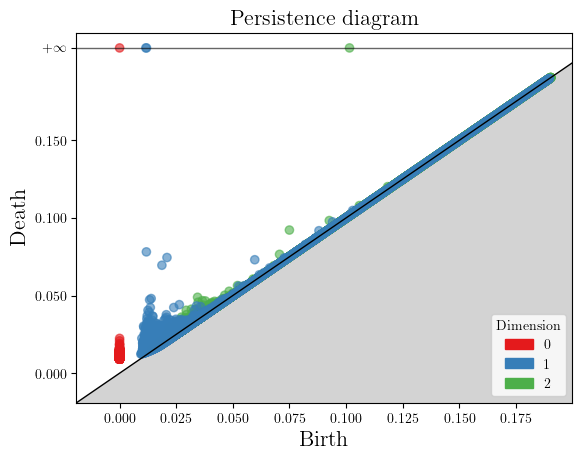

In [41]:
gudhi.plot_persistence_diagram(my_persistence, legend=True)
plt.show()

In [42]:
betti_numbers = {}
for i in range(D):
    betti_numbers[i] = 0
for bar, bd in my_persistence:
    if bd[1] > 10000: 
        betti_numbers[bar] += 1

print("Betti Numbers up to Dimension 3 over the field F_2")
betti_numbers

Betti Numbers up to Dimension 3 over the field F_2


{0: 1, 1: 2, 2: 1}

In [52]:
graphtools.draw_abstract_simplcial_complex(my_alpha_complex)

In [44]:
my_persistence = example2.persistence(homology_coeff_field = 3)

In [45]:
betti_numbers = {}
for i in range(D):
    betti_numbers[i] = 0
for bar, bd in my_persistence:
    if bd[1] > 10000: 
        betti_numbers[bar] += 1

print("Betti Numbers up to Dimension 3 over the field F_3")
betti_numbers

Betti Numbers up to Dimension 3 over the field F_3


{0: 1, 1: 2, 2: 1}